# Importação de Bibliotecas e Reprodutibilidade

In [1]:
import os

# Reforça comportamento determinístico do TensorFlow
os.environ['TF_DETERMINISTIC_OPS'] = '1'
# Filtra mensagens de log de baixa severidade do TensorFlow
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import sys

print("Versão do Python:")
print(sys.version)
print(sys.version_info)

print("\nVersão do NumPy:")
print(np.__version__)

print("\nVersão do Pandas:")
print(pd.__version__)

print("\nVersão do TensorFlow:")
print(tf.__version__)

2023-04-22 14:32:12.073143: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Versão do Python:
3.9.16 (main, Mar  8 2023, 14:00:05) 
[GCC 11.2.0]
sys.version_info(major=3, minor=9, micro=16, releaselevel='final', serial=0)

Versão do NumPy:
1.23.5

Versão do Pandas:
2.0.0

Versão do TensorFlow:
2.10.0


# Download do Conjunto de Dados Inicial

O dataset consiste de uma única imagem de um manômetro, manipulada digitalmente para simular a posição do ponteiro em 13 pontos distintos do range do equipamento (0 - 6 bar).

**Processo de Manipulação Digital**

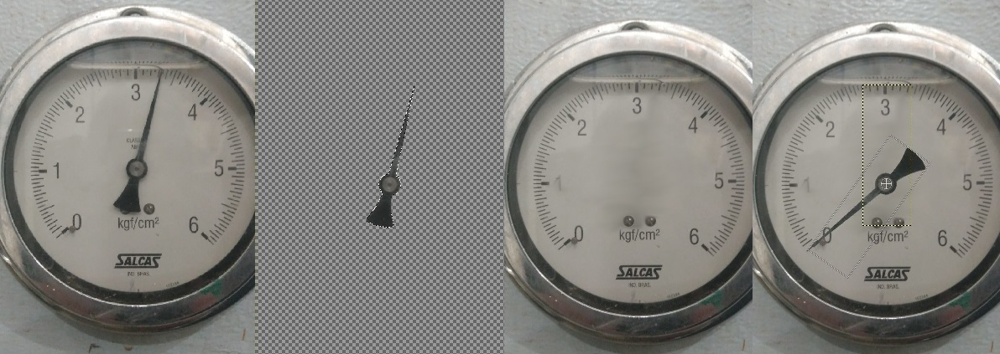

In [3]:
# Os dados estão disponíveis publicamente através do link abaixo:

!wget 'https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Classes.zip' -O 'Classes.zip'

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
--2023-04-22 14:32:13--  https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Classes.zip
Loaded CA certificate '/etc/ssl/certs/ca-certificates.crt'
Resolving github.com (github.com)... 20.201.28.151
Connecting to github.com (github.com)|20.201.28.151|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/cjkjunior/Relatorio_Final_Pos_IA/main/Classes.zip [following]
--2023-04-22 14:32:14--  https://raw.githubusercontent.com/cjkjunior/Relatorio_Final_Pos_IA/main/Classes.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8000::154, 2606:50c0:8002::154, 2606:50c0:8001::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1804029 (1.7M) [application/zip]

In [4]:
# Descompactando o arquivo Classes.zip

import zipfile

zip_ref = zipfile.ZipFile("Classes.zip")
zip_ref.extractall()
zip_ref.close()

# Inspecionando os Dados

In [5]:
# Listando os diretórios do arquivo descompactado

!ls Classes

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
0  0_5	1  1_5	2  2_5	3  3_5	4  4_5	5  5_5	6


In [6]:
# Listando os diretórios e arquivos internos

for dirpath, dirnames, filenames in os.walk("Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Classes'
Existem 0 diretórios e 1 imagens na pasta 'Classes/1_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/5_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/2'
Existem 0 diretórios e 1 imagens na pasta 'Classes/2_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/0_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/4_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/3'
Existem 0 diretórios e 1 imagens na pasta 'Classes/3_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/6'
Existem 0 diretórios e 1 imagens na pasta 'Classes/1'
Existem 0 diretórios e 1 imagens na pasta 'Classes/0'
Existem 0 diretórios e 1 imagens na pasta 'Classes/5'
Existem 0 diretórios e 1 imagens na pasta 'Classes/4'


Cada diretório representa uma classe que será utilizada no treinamento do modelo. A nomenclatura corresponde ao valor de pressão, variando com um passo de 0.5 bar dentro do range do equipamento. Por exemplo, o diretório 3_5 contém as imagens relativas à classe cuja leitura do ponteiro é de 3.5 bar.

In [7]:
# Gerando um array que contém a identificação de todas as classes

import pathlib

data_dir = pathlib.Path("Classes")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")]))
print(class_names)

['0' '0_5' '1' '1_5' '2' '2_5' '3' '3_5' '4' '4_5' '5' '5_5' '6']


In [8]:
# Visualizando imagens aleatórias de cada classe

from operator import index
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

def view_random_images(img_dir, class_names):
  """
    Plota imagens aleatórias de cada classe (subdiretório) especificada em determinado diretório.
  """
  plt.figure(figsize=(16, 8))
  for a in class_names:
    target_class = a
    target_dir = img_dir + "/" + target_class
    random_image = random.choice(os.listdir(target_dir))
    random_image_path = target_dir + "/" + random_image
    img = mpimg.imread(random_image_path)
    plt.subplot(2, 7, list(class_names).index(a) + 1)
    plt.imshow(img)
    plt.title(f"Classe {target_class}")
    plt.axis(False)

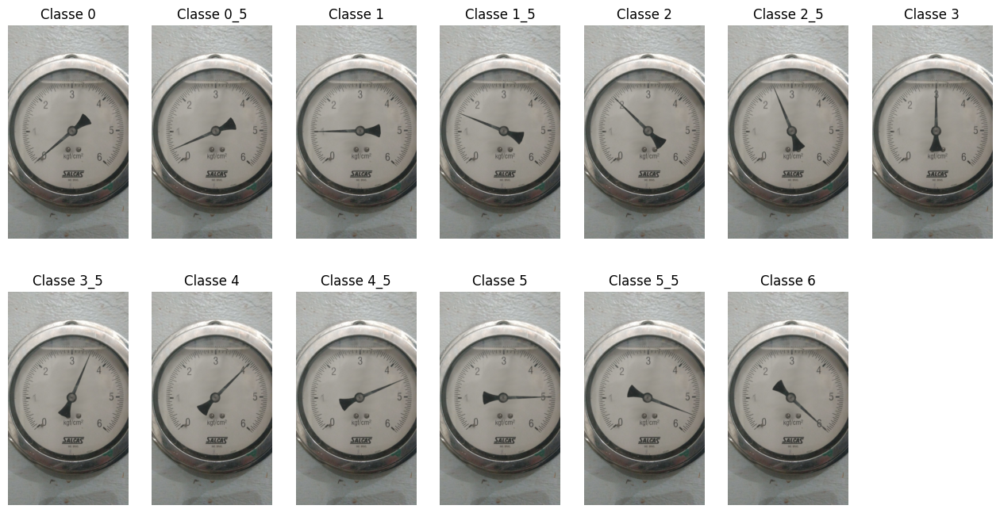

In [9]:
# Executando a função view_random_images nesta etapa, vemos apenas a imagem 
# inicial de classe. Nas etapas posteriores, após o processo de data augmentation, 
# a função retornará exemplos aleatórios.

view_random_images("Classes", class_names)

# Data Augmentation

Apesar da versão atual do TensorFlow permitir a utilização de técnicas de data augmentation durante o treinamento, optou-se por criar as imagens em etapa anterior, além da utilização de distorções não presentes na classe ImageDataGenerator. O script abaixo gera `n_images` de cada classe, aplicando as transformações definidas no `ImageDataGenerator`.

In [10]:
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img

# A variável fill_color define a cor de preenchimento das regiões deslocadas
# pelas transformações resultantes do processo de data augmentation. O modo
# de preenchimento adotado foi o "constant", como pode-se verificar abaixo. 
fill_color=(122,122,122)

# A variável n_images define o número de imagens geradas pela função
n_images = 200

# A variável noise_stddev ajusta o nível de ruído que será aplicado na imagem
noise_stddev = 0.05

# A função noise_generator é responsável por adicionar distorções nas imagens
# aumentadas, visto que esta funcionalidade não existe na classe ImageDataGenerator
def noise_generator(datagen, noise_stddev, save_to_dir, save_prefix, save_format):
    """
    Aplica distorção gaussiana nas imagens dos batches.
    """
    for x in datagen:
        # Cria uma máscara para as regiões diferentes de zero
        mask = x > 0

        # Adiciona distorção Gaussiana na imagem
        noise = np.random.normal(0, noise_stddev, x.shape) * mask
        x_noise = np.clip(x + noise, 0, 1)

        # Salva a imagem distorcida
        if save_to_dir:
            img = array_to_img(x_noise[0], scale=True)
            fname = f"{save_prefix}_{i}.{save_format}"
            img.save(os.path.join(save_to_dir, fname))

        yield x_noise

def rgb_to_gray(rgb):
    """
    Converte uma tupla representando um valor de cor na escala RGB para um valor escalar em escala de cinza que será utilizado na propriedade cval do ImageDataGenerator.
    """
    return 0.2989 * rgb[0] + 0.5870 * rgb[1] + 0.1140 * rgb[2]

# O loop a seguir gera n imagens para cada classe em class_names, usando uma
# única imagem original. São aplicadas diversas técnicas de data augmentation 
# como rotação, deslocamento, zoom e ruído, com o objetivo de criar um conjunto 
# diversificado de imagens para cada classe.
for a in class_names:
    img_path = 'Classes/' + a + '/' + a + '.jpg'
    save_dir = 'Classes/' + a
    aug_number = n_images - 2

    datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.01,
        height_shift_range=0.01,
        shear_range=0.01,
        zoom_range=(0.85, 1.15),
        horizontal_flip=False,
        fill_mode='constant',
        cval=rgb_to_gray(fill_color),
        brightness_range=[0.1, 1.8],
        channel_shift_range=0.5,
        rescale=1.0/255.0
    )

    img = load_img(img_path)
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)

    # O comando .flow() gera batches de imagens transformadas aleatoriamente
    base_generator = datagen.flow(x, batch_size=1)

    # Aplica a distorção usando a função noise_generator
    noise_gen = noise_generator(base_generator, noise_stddev, save_dir, save_prefix=a, save_format='jpeg')

    i = 0
    for batch in noise_gen:
        i += 1
        if i > aug_number:
            break  # Previne um loop infinito

    # Reseta o gerador de imagens de modo que ele não reinicie do ponto de 
    # parada na próxima iteração
    del datagen

In [11]:
# Verificando novamente os arquivos e diretórios

for dirpath, dirnames, filenames in os.walk("Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Classes'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2'
Existem 0 diretórios e 200 imagens na pasta 'Classes/2_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3'
Existem 0 diretórios e 200 imagens na pasta 'Classes/3_5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/6'
Existem 0 diretórios e 200 imagens na pasta 'Classes/1'
Existem 0 diretórios e 200 imagens na pasta 'Classes/0'
Existem 0 diretórios e 200 imagens na pasta 'Classes/5'
Existem 0 diretórios e 200 imagens na pasta 'Classes/4'


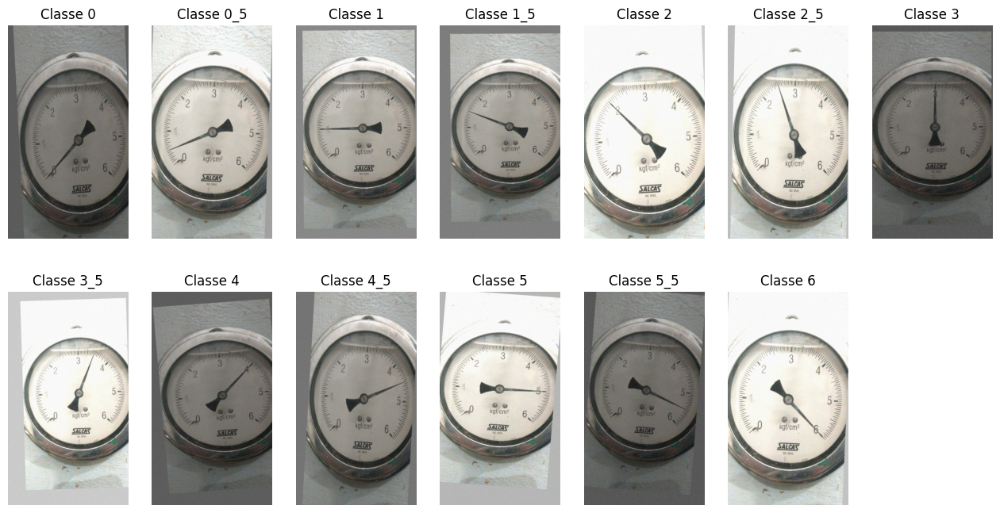

In [12]:
# Executando a função view_random_images nesta etapa, vemos agora exemplos 
# aleatórios das novas imagens geradas.

view_random_images("Classes", class_names)

# Preparação de Dados para o Treinamento

A criação dos datasets fará uso do método flow_from_directory e dividirá as imagens em lotes definidos pelo parâmetro `batch_size`, além de realizar a divisão do conjunto em Treinamento e Validação, normalizar as imagens e alterar o formato para um tensor de 4 dimensões, compatível com a entrada da primeira camada do modelo à ser criado. Os nomes das classes derivam dos nomes dos diretórios e serão transformados para o formato `one-hot-encoded` de acordo com a propriedade `class_mode` escolhida abaixo (`"categorical"`).

In [13]:
# Gerando os datasets para treinamento

data_dir = "Classes"

train_datagen = ImageDataGenerator(rescale=1/255.,
                                   validation_split=0.2)  # Adicionado de modo que o dataset seja dividido automaticamente na proporção 80/20 - Treinamento/Validação

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='training',  # Identificação do conjunto de treinamento
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='validation',  # Identificação do conjunto de validação
    seed=42
)

Found 2080 images belonging to 13 classes.
Found 520 images belonging to 13 classes.


Criados os lotes e realizada a divisão, podemos inspecionar os dados já formatados:

In [14]:
# A função abaixo permite inspecionar visualmente as 32 imagens presente no lote/batch

def visualize_batch(image_batch, label_batch, class_names):
    """
    Plota um lote completo de imagens preparadas para treinamento.
    """
    plt.figure(figsize=(20, 20))
    for n in range(32):
        ax = plt.subplot(8, 4, n + 1)
        plt.imshow(image_batch[n])
        plt.title(class_names[np.argmax(label_batch[n])])
        plt.axis("off")

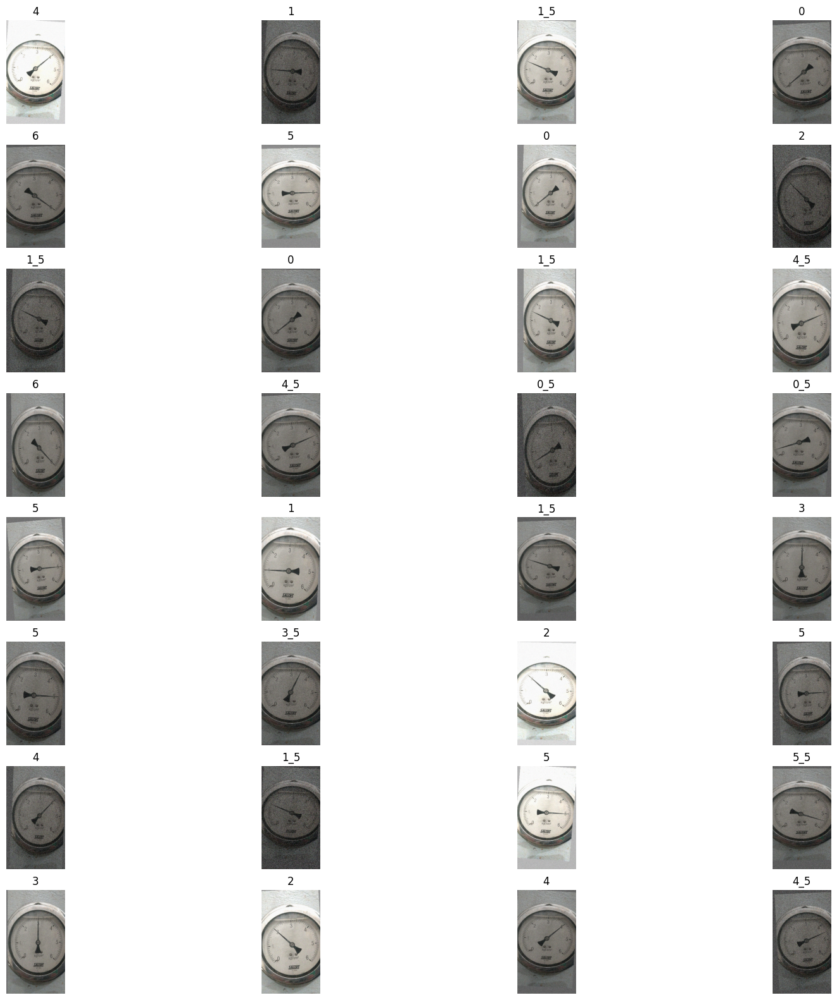

In [15]:
# Busca um lote e chama a função de visualização

image_batch, label_batch = next(train_generator)

visualize_batch(image_batch, label_batch, class_names)

In [16]:
# É possível verificar as labels das imagens (já no formato one-hot-encoded)

print(label_batch)

[[0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.

In [17]:
# E também o formato do batch

print(image_batch)

[[[[0.83921576 0.82745105 0.854902  ]
   [0.82745105 0.8235295  0.80392164]
   [0.78823537 0.7843138  0.76470596]
   ...
   [0.8235295  0.8078432  0.7960785 ]
   [0.8117648  0.79215693 0.77647066]
   [0.8078432  0.83921576 0.85098046]]

  [[0.7411765  0.73333335 0.7372549 ]
   [0.8196079  0.81568635 0.8000001 ]
   [0.8470589  0.8431373  0.82745105]
   ...
   [0.8078432  0.8117648  0.79215693]
   [0.8196079  0.83921576 0.8117648 ]
   [0.8196079  0.8196079  0.8588236 ]]

  [[0.80392164 0.8000001  0.7803922 ]
   [0.86666673 0.8588236  0.86274517]
   [0.8431373  0.8352942  0.83921576]
   ...
   [0.7843138  0.80392164 0.7803922 ]
   [0.81568635 0.8352942  0.8078432 ]
   [0.83921576 0.85098046 0.8862746 ]]

  ...

  [[0.8078432  0.8313726  0.81568635]
   [0.7803922  0.8000001  0.7843138 ]
   [0.77647066 0.7843138  0.7725491 ]
   ...
   [0.8117648  0.8078432  0.82745105]
   [0.85098046 0.8470589  0.8705883 ]
   [0.86666673 0.8588236  0.86274517]]

  [[0.83921576 0.8588236  0.8431373 ]
   [0.8

# Criação do Modelo

O modelo escolhido consiste de uma Rede Neural Convolucional, dadas as vantagens, robustez e performance destas em problemas de reconhecimento e classificação de imagens. Adotaram-se as funções `relu` para ativação das camadas e entropia cruzada categórica (`categorical_cross_entropy`) para a perda. A métrica utilizada será a acurácia (`accuracy`).

In [18]:
# Criação do modelo utilizando a API Sequential do Keras

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Activation
from tensorflow.keras import Sequential

base_model = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(64, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(128, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(256, activation="relu"),
    Dense(13, activation="softmax")
])

In [19]:
# É possível verificar o número de parâmetros e a distribuição de camadas através
# de um sumário do modelo criado

base_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 398, 223, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 199, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 197, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 98, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 96, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 48, 26, 128)      0

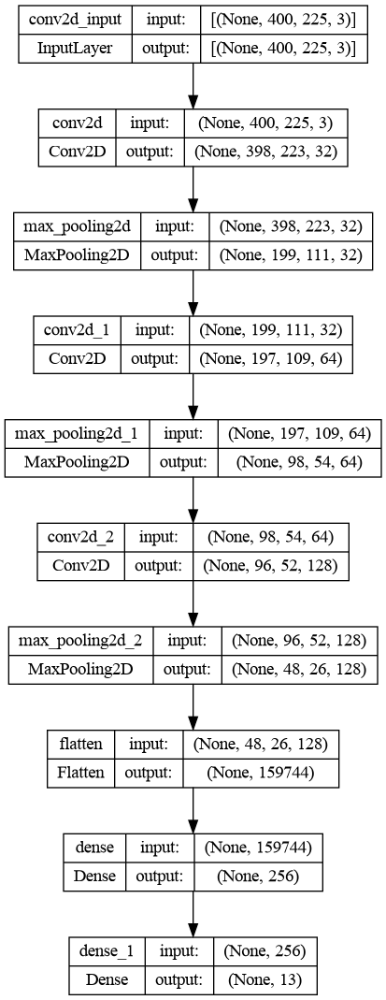

In [20]:
# Também é possível plotar graficamente o modelo e verificar os formatos de entrada
# e saída de cada camada

from tensorflow.keras.utils import plot_model
from IPython.display import Image

plot_model(base_model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

Image(filename='model_plot.png')

Este modelo foi projetado para classificar imagens em 13 classes diferentes, usando uma combinação de camadas convolucionais e totalmente conectadas. As camadas convolucionais ajudam a aprender características específicas das imagens, enquanto as camadas totalmente conectadas aprendem a representação global e realizam a classificação final.

In [21]:
# Compilando o modelo

base_model.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

In [22]:
#Checando a disponibilidade e modelo da GPU alocada

!nvidia-smi

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
Sat Apr 22 14:42:43 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.41.03              Driver Version: 530.41.03    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3080 Ti      Off| 00000000:2B:00.0  On |                  N/A |
| 47%   50C    P2              115W / 350W|  10417MiB / 12288MiB |     15%      Default |
|                             

# Treinando o Modelo

In [23]:
# O método fit é utilizado para treinar o modelo e retorna um objeto History 
# que contém a perda de treinamento e os valores das métricas para cada época

history = base_model.fit(train_generator,
                    epochs=5,
                    steps_per_epoch=len(train_generator),
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/5
65/65 [==============================] - 20s 272ms/step - loss: 2.8739 - accuracy: 0.0894 - val_loss: 2.5648 - val_accuracy: 0.0769
Epoch 2/5
65/65 [==============================] - 18s 270ms/step - loss: 2.5532 - accuracy: 0.1476 - val_loss: 2.5146 - val_accuracy: 0.4327
Epoch 3/5
65/65 [==============================] - 17s 263ms/step - loss: 1.8362 - accuracy: 0.4678 - val_loss: 1.0090 - val_accuracy: 0.6442
Epoch 4/5
65/65 [==============================] - 17s 267ms/step - loss: 0.5931 - accuracy: 0.8038 - val_loss: 0.3806 - val_accuracy: 0.8788
Epoch 5/5
65/65 [==============================] - 17s 267ms/step - loss: 0.2247 - accuracy: 0.9293 - val_loss: 0.3119 - val_accuracy: 0.8808


# Visualizando e Interpretando os Resultados

In [24]:
# Verificando o objeto history

print(history)
print(history.history)

{'loss': [2.8739395141601562, 2.5532426834106445, 1.8361777067184448, 0.5931176543235779, 0.2246817946434021], 'accuracy': [0.08942307531833649, 0.14759615063667297, 0.4677884578704834, 0.8038461804389954, 0.9293269515037537], 'val_loss': [2.5647668838500977, 2.5145506858825684, 1.009007215499878, 0.38057518005371094, 0.3118983507156372], 'val_accuracy': [0.07692307978868484, 0.4326923191547394, 0.6442307829856873, 0.8788461685180664, 0.8807692527770996]}


In [25]:
# Criando uma função que plota as curvas das funções de perda e métricas

def plot_loss_curves(history):
  """
  Retorna a plotagem das curvas de treinamento e validação do objeto History de um modelo.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  # Plota a perda
  plt.plot(epochs, loss, label="perda_treinamento")
  plt.plot(epochs, val_loss, label="perda_validação")
  plt.title("Perda")
  plt.xlabel("Épocas")
  plt.legend()

  # Plota a acurácia
  plt.figure()
  plt.plot(epochs, accuracy, label="acurácia_treinamento")
  plt.plot(epochs, val_accuracy, label="acurácia_validação")
  plt.title("Acurácia")
  plt.xlabel("Épocas")
  plt.legend()

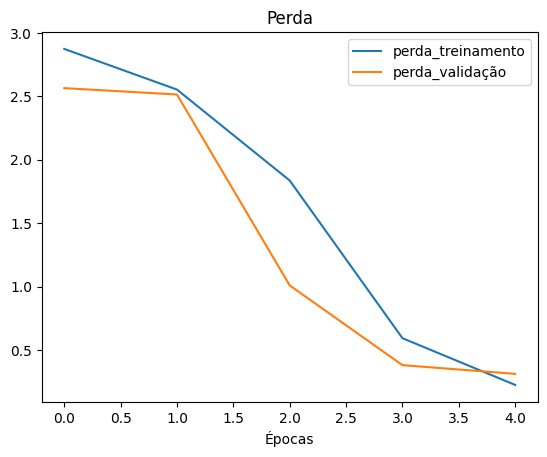

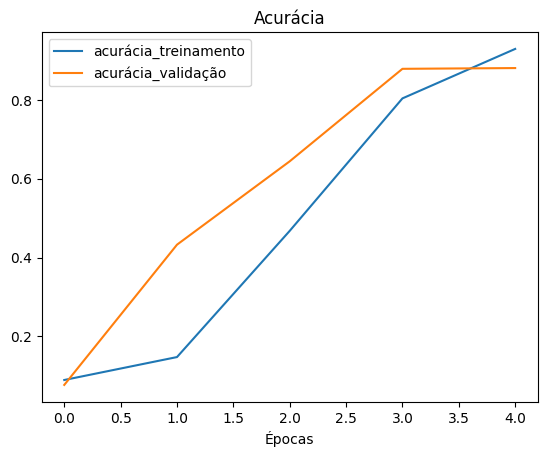

In [26]:
plot_loss_curves(history)

Com base nos resultados, constata-se que, aparentemente, o modelo está aprendendo e generalizando bem no conjunto de dados de validação. Não há sinal claro de over ou underfitting, visto que as acurácias de treinamento e validação são altas e as perdas baixas.

# Avaliação do Modelo

Para fins de avaliação de performance, gerou-se um dataset de testes a partir de uma nova imagem, através do mesmo script de Data Augmentation executado acima. O passo foi omitido e o dataset disponibilizado pronto no link abaixo.

In [27]:
# Obtendo um conjunto de imagens de teste, não utilizadas no treinamento

!wget 'https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Test_Classes.zip' -O "Test_Classes.zip"

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
--2023-04-22 14:44:13--  https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Test_Classes.zip
Loaded CA certificate '/etc/ssl/certs/ca-certificates.crt'
Resolving github.com (github.com)... 20.201.28.151
Connecting to github.com (github.com)|20.201.28.151|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/cjkjunior/Relatorio_Final_Pos_IA/main/Test_Classes.zip [following]
--2023-04-22 14:44:16--  https://media.githubusercontent.com/media/cjkjunior/Relatorio_Final_Pos_IA/main/Test_Classes.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 2606:50c0:8001::154, 2606:50c0:8000::154, 2606:50c0:8002::154, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|2606:50c0:8001::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
L

In [28]:
# Descompactando o arquivo

zip_ref = zipfile.ZipFile("Test_Classes.zip")
zip_ref.extractall()
zip_ref.close()

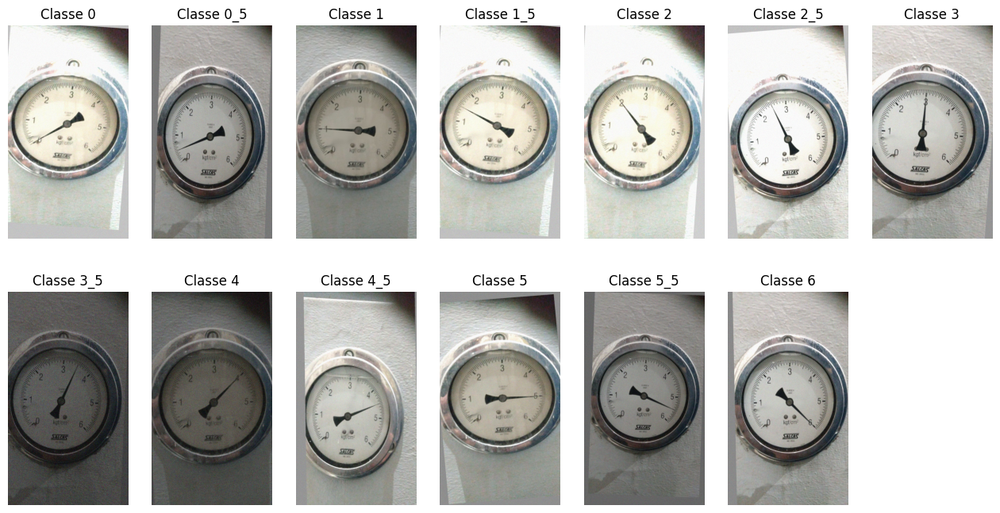

In [29]:
# Executando a função view_random_images no diretório Test_Classes, vemos agora exemplos 
# aleatórios das imagens provenientes de uma nova fonte.

view_random_images("Test_Classes", class_names)

In [30]:
# Verificando os arquivos e diretórios em Test_Classes

for dirpath, dirnames, filenames in os.walk("Test_Classes"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 13 diretórios e 0 imagens na pasta 'Test_Classes'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/1_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/5_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/2'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/2_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/0_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/4_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/3'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/3_5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/6'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/1'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/0'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/5'
Existem 0 diretórios e 36 imagens na pasta 'Test_Classes/4'


In [31]:
# Criando um dataset de teste

test_data_dir = "Test_Classes"

test_datagen = ImageDataGenerator(rescale=1/255.)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 468 images belonging to 13 classes.


In [32]:
# Avaliando o modelo nos novos dados

test_loss, test_accuracy = base_model.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

15/15 [==============================] - 3s 197ms/step - loss: 8.2665 - accuracy: 0.2265
Perda do Conjunto de Testes: 8.266459465026855
Acurácia do Conjunto de Testes: 0.22649572789669037


Os resultados indicam um possível problema de overfitting no modelo. Verifica-se discrepância significativa entre o desempenho no conjunto de validação e no conjunto de testes. Os valores de acurácia a perda significativa, sugerem que o modelo provavelmente aprendeu muito bem os dados de treinamento e seu ruído inerente, resultando em uma capacidade reduzida de generalização.

Usualmente, várias abordagens podem ser exploradas para mitigação do overfitting, como refinamento da arquitetura do modelo, implementação de técnicas de regularização ou ajuste de hiperparâmetros de treinamento. Contudo, a causa mais provavel no presente caso deve-se a falta de diversidade nos dados do conjunto.

# Adequações e Experimentação

## Obtendo novos dados

Obtiveram-se três novas imagens do mesmo equipamento, nomeadas com os seguintes sufixos `_a`, `_b` e `_c`. Todas passaram pela mesma manipulação digital (alteração da posição do ponteiro) da imagem original. Adotou-se a seguinte divisão dos dados:

- **Conjunto de Treinamento:** Imagem original + sufixo `_a`;
- **Conjunto de Validação:** Sufixo `_b`;
- **Conjunto de Testes:** Sufixo `_c`;

O script de Data Augmentation foi melhorado para se adequar aos novos dados. Serão geradas 500 imagens no conjunto de treinamento (250 de cada fonte) e 150 imagens para os demais conjuntos.

**Novas Imagens**

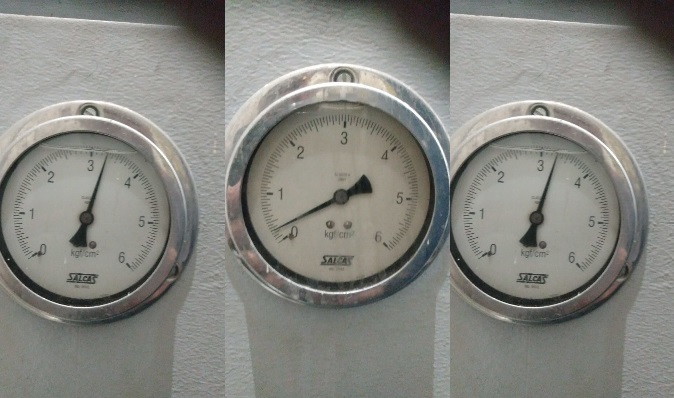

In [33]:
# Obtendo o conjunto baseado nas novas imagens

!wget 'https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Classes_2.zip' -O "Classes_2.zip"

/usr/bin/zsh: /home/junior/miniconda3/envs/tf/lib/libncursesw.so.6: no version information available (required by /usr/bin/zsh)
--2023-04-22 14:44:56--  https://github.com/cjkjunior/Relatorio_Final_Pos_IA/raw/main/Classes_2.zip
Loaded CA certificate '/etc/ssl/certs/ca-certificates.crt'
Resolving github.com (github.com)... 20.201.28.151
Connecting to github.com (github.com)|20.201.28.151|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/cjkjunior/Relatorio_Final_Pos_IA/main/Classes_2.zip [following]
--2023-04-22 14:44:57--  https://raw.githubusercontent.com/cjkjunior/Relatorio_Final_Pos_IA/main/Classes_2.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8000::154, 2606:50c0:8002::154, 2606:50c0:8001::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7731762 (7.4M) [applicatio

In [34]:
# Descompactando o arquivo

zip_ref = zipfile.ZipFile("Classes_2.zip")
zip_ref.extractall()
zip_ref.close()

In [35]:
# Verificando os arquivos e diretórios

for dirpath, dirnames, filenames in os.walk("Classes_2"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 3 diretórios e 0 imagens na pasta 'Classes_2'
Existem 13 diretórios e 0 imagens na pasta 'Classes_2/validation'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/1_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/5_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/2'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/2_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/0_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/4_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/3'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/3_5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/6'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/1'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/0'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/5'
Existem 0 diretórios e 1 imagens na pasta 'Classes_2/validation/

## Data Agumentation

In [36]:
# Script Melhorado
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import array_to_img, img_to_array, load_img

# A variável fill_color define a cor de preenchimento das regiões deslocadas
# pelas transformações resultantes do processo de data augmentation. O modo
# de preenchimento adotado foi o "constant", como pode-se verificar abaixo. 
fill_color = (122, 122, 122)

# A variável n_images define o número de imagens geradas pela função
# no formato [treinamento, validação, teste]
n_images = [250, 150, 150]

# A variável noise_stddev ajusta o nível de ruído que será aplicado na imagem
noise_stddev = 0.05

# A função noise_generator é responsável por adicionar distorções nas imagens
# aumentadas, visto que esta funcionalidade não existe na classe ImageDataGenerator
def noise_generator(datagen, noise_stddev, save_to_dir, save_prefix, save_format, i):
    for x in datagen:
        mask = x > 0
        noise = np.random.normal(0, noise_stddev, x.shape) * mask
        x_noise = np.clip(x + noise, 0, 1)

        if save_to_dir:
            img = array_to_img(x_noise[0], scale=True)
            fname = f"{save_prefix}_{i[0]}.{save_format}"
            img.save(os.path.join(save_to_dir, fname))

        i[0] += 1
        yield x_noise

# A função rgb_to_gray converte uma tupla representando um valor de cor na escala
# RGB para um valor escalar em escala de cinza que será utilizado na propriedade
# cval do ImageDataGenerator
def rgb_to_gray(rgb):
    return 0.2989 * rgb[0] + 0.5870 * rgb[1] + 0.1140 * rgb[2]

# Função melhorada para comportar a nova estrutura de diretórios e imagens
def generate_augmented_images(img_path, save_dir, aug_number, save_prefix):
    datagen = ImageDataGenerator(
        rotation_range=5,
        width_shift_range=0.01,
        height_shift_range=0.01,
        shear_range=0.01,
        zoom_range=(0.85, 1.15),
        horizontal_flip=False,
        fill_mode='constant',
        cval=rgb_to_gray(fill_color),
        brightness_range=[0.1, 1.8],
        channel_shift_range=0.5,
        rescale=1.0 / 255.0
    )

    img = load_img(img_path)
    x = img_to_array(img)
    x = x.reshape((1,) + x.shape)

    # O comando .flow() gera batches de imagens transformadas aleatoriamente
    base_generator = datagen.flow(x, batch_size=1)
    i = [0]
    # Aplica a distorção usando a função noise_generator
    noise_gen = noise_generator(base_generator, noise_stddev, save_dir, save_prefix=save_prefix, save_format='jpeg', i=i)

    for batch in noise_gen:
        if i[0] > aug_number:
            break

    del datagen

# Define os sufixos das novas imagens
datasets = ['training', 'validation', 'test']
suffixes = {'training': ['', '_a'], 'validation': ['_b'], 'test': ['_c']}
images_to_generate = {'training': n_images[0], 'validation': n_images[1], 'test': n_images[2]}

# Loop de iteração dos datasets
for dataset in datasets:
    for class_name in class_names:
        for suffix in suffixes[dataset]:
            img_path = f'Classes_2/{dataset}/{class_name}/{class_name}{suffix}.jpg'
            save_dir = f'Classes_2/{dataset}/{class_name}'
            aug_number = images_to_generate[dataset] - 2
            generate_augmented_images(img_path, save_dir, aug_number, save_prefix=f"{class_name}{suffix}")

In [37]:
# Verificando o número de imagens geradas

for dirpath, dirnames, filenames in os.walk("Classes_2"):
  print(f"Existem {len(dirnames)} diretórios e {len(filenames)} imagens na pasta '{dirpath}'")

Existem 3 diretórios e 0 imagens na pasta 'Classes_2'
Existem 13 diretórios e 0 imagens na pasta 'Classes_2/validation'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/2_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/4_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/3_5'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/6'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/1'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/0'
Existem 0 diretórios e 150 imagens na pasta 'Classes_2/validation/5'
Existem 0 diretórios e 150 imagens na pa

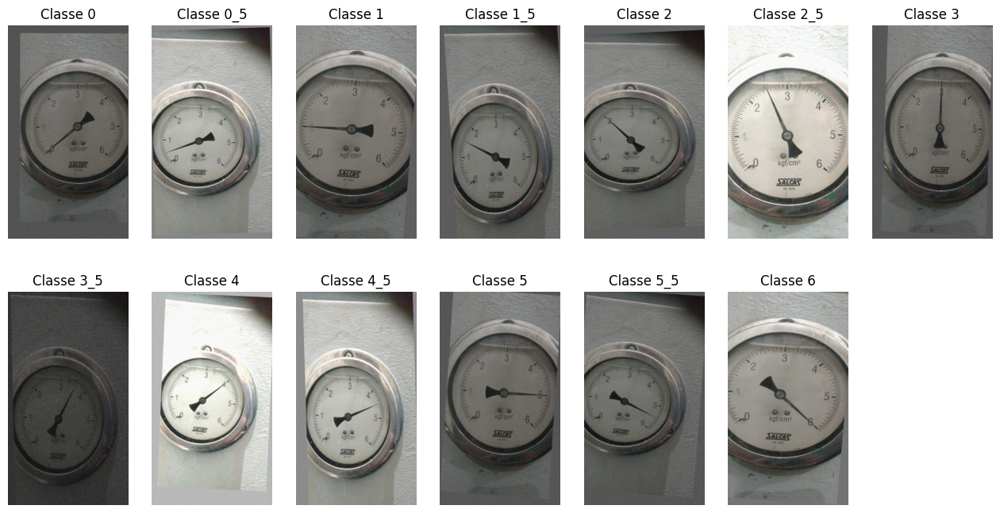

In [38]:
# Visualizando o conjunto de treinamento

view_random_images("Classes_2/training", class_names)

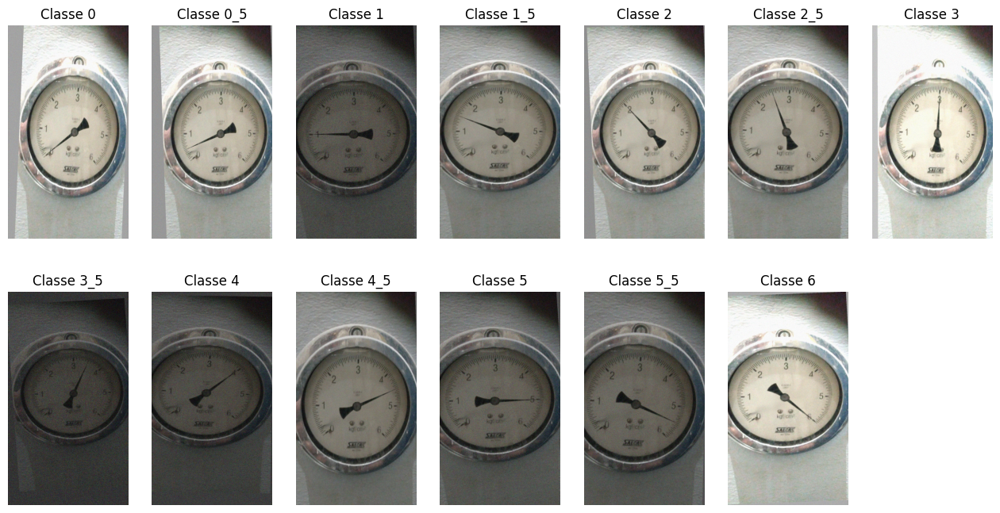

In [39]:
# Visualizando o conjunto de validação

view_random_images("Classes_2/validation", class_names)

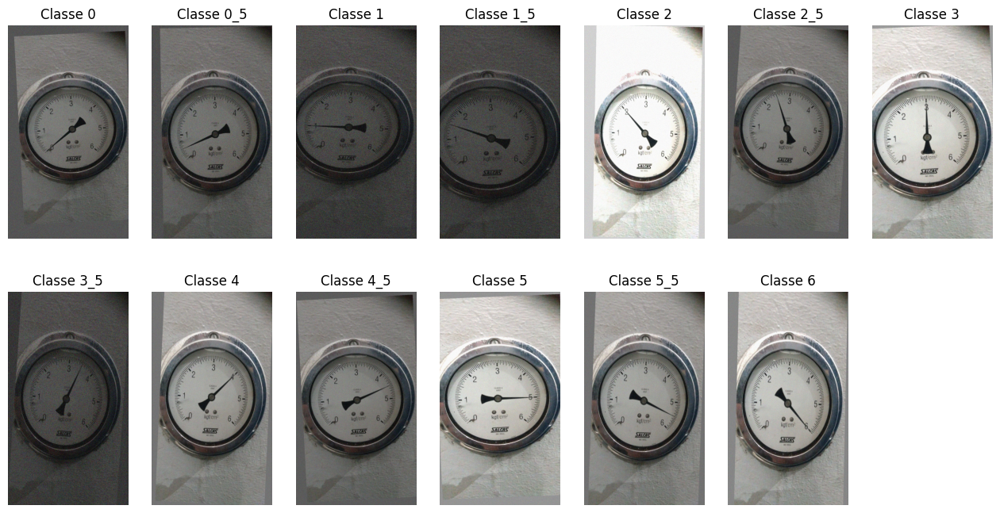

In [40]:
# Visualizando o conjunto de testes

view_random_images("Classes_2/test", class_names)

## Preparação dos Dados para Treinamento

In [41]:
# Gerando os datasets para treinamento

data_dir = "Classes_2"

train_datagen = ImageDataGenerator(rescale=1/255.)

train_generator = train_datagen.flow_from_directory(
    "Classes_2/training",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    "Classes_2/validation",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

Found 6500 images belonging to 13 classes.
Found 1950 images belonging to 13 classes.


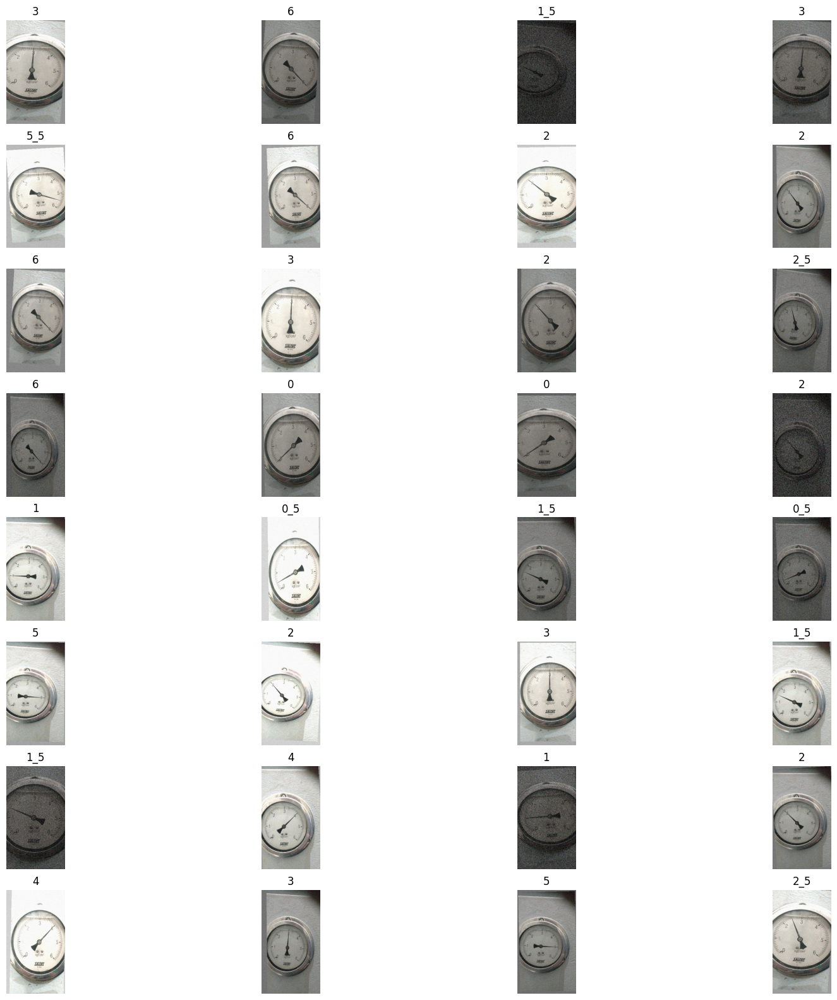

In [42]:
# Busca um lote e chama a função de visualização

image_batch, label_batch = next(train_generator)

visualize_batch(image_batch, label_batch, class_names)

## Treinamento nos Novos Datasets

In [43]:
# Compilando o modelo

base_model.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history = base_model.fit(train_generator,
                    epochs=10,
                    steps_per_epoch=len(train_generator),
                    validation_data=val_generator,
                    validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 58s 281ms/step - loss: 1.4473 - accuracy: 0.5286 - val_loss: 2.9228 - val_accuracy: 0.4041
Epoch 2/10
204/204 [==============================] - 56s 274ms/step - loss: 0.2260 - accuracy: 0.9297 - val_loss: 3.9679 - val_accuracy: 0.4328
Epoch 3/10
204/204 [==============================] - 57s 281ms/step - loss: 0.0674 - accuracy: 0.9809 - val_loss: 4.0479 - val_accuracy: 0.4656
Epoch 4/10
204/204 [==============================] - 57s 280ms/step - loss: 0.0376 - accuracy: 0.9886 - val_loss: 5.1794 - val_accuracy: 0.5051
Epoch 5/10
204/204 [==============================] - 57s 279ms/step - loss: 0.0392 - accuracy: 0.9905 - val_loss: 3.9187 - val_accuracy: 0.5133
Epoch 6/10
204/204 [==============================] - 57s 280ms/step - loss: 0.0216 - accuracy: 0.9940 - val_loss: 4.4001 - val_accuracy: 0.4872
Epoch 7/10
204/204 [==============================] - 56s 276ms/step - loss: 0.0321 - accuracy: 0.9920 - val_loss: 3.1504 - val_ac

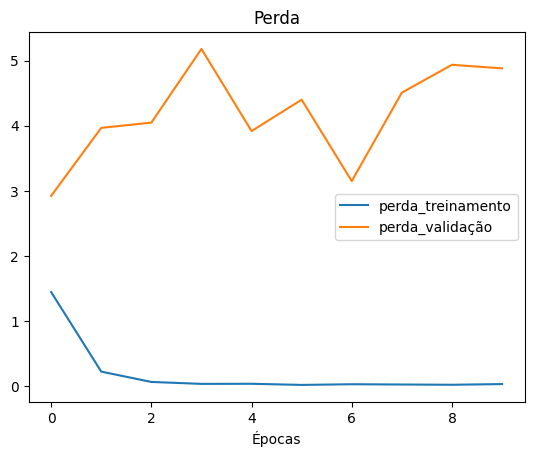

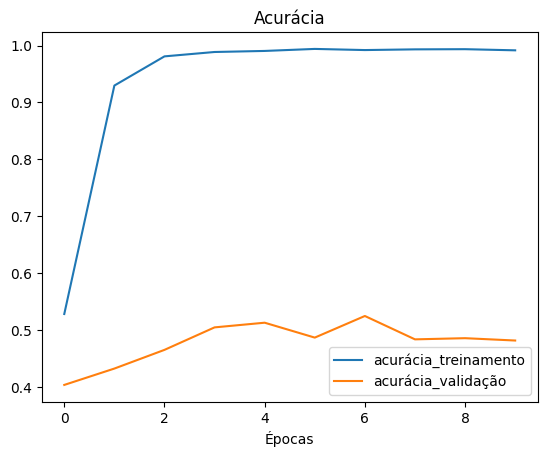

In [44]:
plot_loss_curves(history)

Observa-se que a introdução de novos dados nos conjuntos resultou em valores mais realistas para a acurácia e perda do conjunto de validação. O overfitting fica agora mais visível.

## Revisando a Arquitetura do Modelo

### Experimento 1 - Reduzindo a Complexidade do Modelo

In [45]:
# Partindo-se do modelo inicial, reduz-se a complexidade deste através da
# eliminação de determinadas camadas

model_1 = Sequential([
    Conv2D(32, 3, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(64, 3, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [46]:
model_1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 398, 223, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 199, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 197, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 98, 54, 64)       0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 338688)            0         
                                                                 
 dense_2 (Dense)             (None, 13)               

O menor número de camadas resultou num número muito menor de parâmetros. O modelo original possuia `40.991.309` contra `4.422.349` do modelo atual.

In [47]:
# Compilando o modelo

model_1.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_1 = model_1.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 56s 273ms/step - loss: 2.8071 - accuracy: 0.2517 - val_loss: 1.5588 - val_accuracy: 0.5272
Epoch 2/10
204/204 [==============================] - 54s 267ms/step - loss: 0.7586 - accuracy: 0.7935 - val_loss: 1.0214 - val_accuracy: 0.6687
Epoch 3/10
204/204 [==============================] - 55s 268ms/step - loss: 0.1606 - accuracy: 0.9648 - val_loss: 1.1816 - val_accuracy: 0.6497
Epoch 4/10
204/204 [==============================] - 56s 275ms/step - loss: 0.0408 - accuracy: 0.9942 - val_loss: 1.3107 - val_accuracy: 0.6349
Epoch 5/10
204/204 [==============================] - 57s 280ms/step - loss: 0.0153 - accuracy: 0.9980 - val_loss: 1.4308 - val_accuracy: 0.6431
Epoch 6/10
204/204 [==============================] - 54s 267ms/step - loss: 0.0115 - accuracy: 0.9978 - val_loss: 1.5308 - val_accuracy: 0.6308
Epoch 7/10
204/204 [==============================] - 55s 269ms/step - loss: 0.0070 - accuracy: 0.9995 - val_loss: 1.6995 - val_ac

Constata-se que o modelo ainda sofre com o overfitting. A próxima alternativa à ser explorada consiste na alteração da arquitetura do modelo.

### Experimento 2 - Definindo-se uma Nova Arquitetura Base

In [48]:
# Experimento com arquitetura distinta

model_2 = Sequential([
    Conv2D(2, 2, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(128, 2, activation="relu"),
    Flatten(),
    Dense(13, activation="softmax")
])

In [49]:
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 399, 224, 2)       26        
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 199, 112, 2)      0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 198, 111, 4)       36        
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 99, 55, 4)        0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 98, 54, 8)         136       
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 49, 27, 8)       

In [50]:
# Compilando o modelo

model_2.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_2 = model_2.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 49s 238ms/step - loss: 2.2418 - accuracy: 0.2065 - val_loss: 1.2935 - val_accuracy: 0.4831
Epoch 2/10
204/204 [==============================] - 48s 234ms/step - loss: 0.4807 - accuracy: 0.8297 - val_loss: 0.6242 - val_accuracy: 0.8082
Epoch 3/10
204/204 [==============================] - 46s 227ms/step - loss: 0.1559 - accuracy: 0.9528 - val_loss: 0.6211 - val_accuracy: 0.8236
Epoch 4/10
204/204 [==============================] - 46s 228ms/step - loss: 0.0923 - accuracy: 0.9709 - val_loss: 0.5221 - val_accuracy: 0.8492
Epoch 5/10
204/204 [==============================] - 47s 230ms/step - loss: 0.0703 - accuracy: 0.9775 - val_loss: 0.7409 - val_accuracy: 0.8354
Epoch 6/10
204/204 [==============================] - 47s 232ms/step - loss: 0.0351 - accuracy: 0.9895 - val_loss: 0.7332 - val_accuracy: 0.8431
Epoch 7/10
204/204 [==============================] - 48s 234ms/step - loss: 0.0465 - accuracy: 0.9874 - val_loss: 0.6000 - val_ac

De maneira contraintuitiva, verifica-se que apesar o maior número de camadas, o modelo 2 apresenta um número significativamente menor de parâmetros. Isto se deve principalmente ao efeito das camadas MaxPool2D e do número inicial de filtros reduzido. Em termos de performance, observa-se ganho em relação aos modelos anteriores na acurácia do conjunto de validação, contudo, ajustes finos adicionais são necessários.

### Experimento 3 - Reduzindo a Complexidade da Nova Arquitetura

In [51]:
# Neste experimento, eliminou-se a última camada convolucional contendo 128 filtros

model_3 = Sequential([
    Conv2D(2, 2, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [52]:
model_3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 399, 224, 2)       26        
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 199, 112, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 198, 111, 4)       36        
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 99, 55, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 98, 54, 8)         136       
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 49, 27, 8)       

In [53]:
# Compilando o modelo

model_3.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_3 = model_3.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 48s 233ms/step - loss: 1.9530 - accuracy: 0.3095 - val_loss: 1.8824 - val_accuracy: 0.3969
Epoch 2/10
204/204 [==============================] - 48s 236ms/step - loss: 0.7230 - accuracy: 0.7352 - val_loss: 1.6412 - val_accuracy: 0.5513
Epoch 3/10
204/204 [==============================] - 48s 233ms/step - loss: 0.4461 - accuracy: 0.8378 - val_loss: 1.6230 - val_accuracy: 0.6231
Epoch 4/10
204/204 [==============================] - 48s 236ms/step - loss: 0.3368 - accuracy: 0.8785 - val_loss: 1.6347 - val_accuracy: 0.6190
Epoch 5/10
204/204 [==============================] - 47s 232ms/step - loss: 0.2485 - accuracy: 0.9118 - val_loss: 2.0795 - val_accuracy: 0.6297
Epoch 6/10
204/204 [==============================] - 47s 229ms/step - loss: 0.2209 - accuracy: 0.9232 - val_loss: 2.3084 - val_accuracy: 0.6344
Epoch 7/10
204/204 [==============================] - 48s 235ms/step - loss: 0.1604 - accuracy: 0.9442 - val_loss: 2.4455 - val_ac

A redução de mais de 50% no número de parâmetros em relação ao modelo 3 se mostrou eficaz.

### Experimento 4 - Ajuste de Hiperparâmetros (Tamanho do Kernel)

In [54]:
# O tamanho do Kernel foi ajustado de forma decremental entre as camadas

model_4 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

In [55]:
model_4.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 394, 219, 2)       296       
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 197, 109, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 193, 105, 4)       204       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 96, 52, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 93, 49, 8)         520       
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 46, 24, 8)       

In [56]:
# Compilando o modelo

model_4.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_4 = model_4.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 48s 235ms/step - loss: 1.6587 - accuracy: 0.4340 - val_loss: 1.0569 - val_accuracy: 0.6200
Epoch 2/10
204/204 [==============================] - 49s 239ms/step - loss: 0.3554 - accuracy: 0.8838 - val_loss: 2.1487 - val_accuracy: 0.6021
Epoch 3/10
204/204 [==============================] - 46s 228ms/step - loss: 0.1811 - accuracy: 0.9457 - val_loss: 1.4697 - val_accuracy: 0.7128
Epoch 4/10
204/204 [==============================] - 47s 232ms/step - loss: 0.0811 - accuracy: 0.9762 - val_loss: 2.3322 - val_accuracy: 0.6569
Epoch 5/10
204/204 [==============================] - 48s 236ms/step - loss: 0.0543 - accuracy: 0.9826 - val_loss: 1.3881 - val_accuracy: 0.7585
Epoch 6/10
204/204 [==============================] - 48s 236ms/step - loss: 0.0365 - accuracy: 0.9886 - val_loss: 1.7290 - val_accuracy: 0.7359
Epoch 7/10
204/204 [==============================] - 49s 239ms/step - loss: 0.0318 - accuracy: 0.9883 - val_loss: 2.3393 - val_ac

Novamente observa-se um ganho na acurácia do conjunto de treinamento.

### Experimento 5 - Adição de Camadas

In [57]:
# A camada convolucional contendo 128 filtros foi novamente adicionada, bem como uma nova camada
# totalmente conectada, a título de experimentação com os novos tamanhos de Kernel

model_5 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    Conv2D(128, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(64, activation="relu"),
    Dense(13, activation="softmax")
])

In [58]:
model_5.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 394, 219, 2)       296       
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 197, 109, 2)      0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 193, 105, 4)       204       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 96, 52, 4)        0         
 g2D)                                                            
                                                                 
 conv2d_26 (Conv2D)          (None, 93, 49, 8)         520       
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 46, 24, 8)       

In [59]:
# Compilando o modelo

model_5.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_5 = model_5.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 47s 231ms/step - loss: 1.5331 - accuracy: 0.4403 - val_loss: 1.2504 - val_accuracy: 0.5785
Epoch 2/10
204/204 [==============================] - 48s 234ms/step - loss: 0.2912 - accuracy: 0.8988 - val_loss: 1.3528 - val_accuracy: 0.6985
Epoch 3/10
204/204 [==============================] - 48s 235ms/step - loss: 0.1204 - accuracy: 0.9649 - val_loss: 1.1610 - val_accuracy: 0.6887
Epoch 4/10
204/204 [==============================] - 47s 232ms/step - loss: 0.0557 - accuracy: 0.9837 - val_loss: 0.8672 - val_accuracy: 0.7867
Epoch 5/10
204/204 [==============================] - 47s 232ms/step - loss: 0.0990 - accuracy: 0.9723 - val_loss: 0.7705 - val_accuracy: 0.7405
Epoch 6/10
204/204 [==============================] - 48s 234ms/step - loss: 0.0174 - accuracy: 0.9949 - val_loss: 0.8604 - val_accuracy: 0.8000
Epoch 7/10
204/204 [==============================] - 48s 233ms/step - loss: 0.0423 - accuracy: 0.9911 - val_loss: 1.5569 - val_ac

Verifica-se que o aumento de complexidade do modelo não implicou em melhor performance no conjunto de validação.

### Experimento 6 - Ajuste de Hiperparâmetros (Taxa de Aprendizado)

In [60]:
# Partindo-se do modelo 4, a taxa de aprendizado do otimizador foi reduzida

model_6 = Sequential([
    Conv2D(2, 7, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 5, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_6.compile(loss="categorical_crossentropy",
              optimizer=Adam(learning_rate=0.0005),
              metrics=["accuracy"])

# Treinando o modelo

history_6 = model_6.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 49s 241ms/step - loss: 1.8319 - accuracy: 0.3672 - val_loss: 0.9538 - val_accuracy: 0.6482
Epoch 2/10
204/204 [==============================] - 48s 237ms/step - loss: 0.3796 - accuracy: 0.8734 - val_loss: 0.5061 - val_accuracy: 0.8308
Epoch 3/10
204/204 [==============================] - 48s 234ms/step - loss: 0.1608 - accuracy: 0.9494 - val_loss: 0.6413 - val_accuracy: 0.8267
Epoch 4/10
204/204 [==============================] - 48s 233ms/step - loss: 0.0740 - accuracy: 0.9794 - val_loss: 0.6296 - val_accuracy: 0.8333
Epoch 5/10
204/204 [==============================] - 47s 231ms/step - loss: 0.0374 - accuracy: 0.9918 - val_loss: 0.6618 - val_accuracy: 0.8421
Epoch 6/10
204/204 [==============================] - 47s 229ms/step - loss: 0.0403 - accuracy: 0.9889 - val_loss: 0.5498 - val_accuracy: 0.8662
Epoch 7/10
204/204 [==============================] - 47s 233ms/step - loss: 0.0131 - accuracy: 0.9980 - val_loss: 0.6003 - val_ac

Taxas de aprendizado menores podem ajudar a reduzir o risco de overfitting, apesar de implicar em tempos de convergência maiores. Entretanto, observando-se os resultados do experimento, a alteração na taxa de aprendizado não teve um impacto significativo.

### Experimento 7 - Ajuste Adicional de Hiperparâmetros

In [61]:
# Partindo-se do modelo 4, realizou-se um novo ajuste no tamanho dos kernels,
# bem como no número de filtros da primeira camada

model_7 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_7.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_7 = model_7.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 50s 245ms/step - loss: 1.7219 - accuracy: 0.3897 - val_loss: 2.3420 - val_accuracy: 0.5544
Epoch 2/10
204/204 [==============================] - 49s 239ms/step - loss: 0.3834 - accuracy: 0.8768 - val_loss: 2.3037 - val_accuracy: 0.6908
Epoch 3/10
204/204 [==============================] - 50s 244ms/step - loss: 0.1533 - accuracy: 0.9511 - val_loss: 2.9709 - val_accuracy: 0.7087
Epoch 4/10
204/204 [==============================] - 49s 239ms/step - loss: 0.0923 - accuracy: 0.9706 - val_loss: 2.3442 - val_accuracy: 0.7672
Epoch 5/10
204/204 [==============================] - 49s 240ms/step - loss: 0.0734 - accuracy: 0.9769 - val_loss: 2.8502 - val_accuracy: 0.7395
Epoch 6/10
204/204 [==============================] - 49s 241ms/step - loss: 0.0416 - accuracy: 0.9863 - val_loss: 3.4758 - val_accuracy: 0.7574
Epoch 7/10
204/204 [==============================] - 49s 240ms/step - loss: 0.0380 - accuracy: 0.9880 - val_loss: 3.9679 - val_ac

Observam-se resultados similares ao modelo 4. O tamanho de Kernel maior induz a rede a aprender características mais abrangentes da imagem, exatamente o objetivo do modelo, ao tentar aprender a posição do ponteiro.

### Experimento 8 - Adição de Camadas de Normalização em Lote

Mesmo sendo submetidas ao processo de normalização através do `ImageDataGenerator`, a normalização em lote pode ajudar estabilizar e acelerar o processo de treinamento, tendo um efeito de regularização e reduzindo o risco de overfitting.

In [62]:
from keras.layers import BatchNormalization

model_8 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_8.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_8 = model_8.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
204/204 [==============================] - 53s 257ms/step - loss: 1.0673 - accuracy: 0.6802 - val_loss: 2.8011 - val_accuracy: 0.0810
Epoch 2/10
204/204 [==============================] - 52s 253ms/step - loss: 0.1729 - accuracy: 0.9622 - val_loss: 1.1487 - val_accuracy: 0.5497
Epoch 3/10
204/204 [==============================] - 50s 245ms/step - loss: 0.0756 - accuracy: 0.9874 - val_loss: 0.2848 - val_accuracy: 0.9092
Epoch 4/10
204/204 [==============================] - 50s 248ms/step - loss: 0.0446 - accuracy: 0.9925 - val_loss: 0.2529 - val_accuracy: 0.9210
Epoch 5/10
204/204 [==============================] - 51s 253ms/step - loss: 0.0243 - accuracy: 0.9975 - val_loss: 0.2700 - val_accuracy: 0.9118
Epoch 6/10
204/204 [==============================] - 51s 249ms/step - loss: 0.0167 - accuracy: 0.9983 - val_loss: 0.2493 - val_accuracy: 0.9210
Epoch 7/10
204/204 [==============================] - 50s 243ms/step - loss: 0.0114 - accuracy: 0.9991 - val_loss: 0.1971 - val_ac

### Experimento 9 - Revisitando o Dataset Original

In [63]:
# Gerando os datasets a partir do diretório original baseado em apenas uma imagem

data_dir = "Classes"

train_datagen = ImageDataGenerator(rescale=1/255.,
                                   validation_split=0.2)  # Adicionado de modo que o dataset seja dividido automaticamente na proporção 80/20 - Treinamento/Validação

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='training',  # Identificação do conjunto de treinamento
    seed=42
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    subset='validation',  # Identificação do conjunto de validação
    seed=42
)

Found 2080 images belonging to 13 classes.
Found 520 images belonging to 13 classes.


In [64]:
model_9 = Sequential([
    Conv2D(4, 9, activation="relu", input_shape=(400, 225, 3)),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(4, 6, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(8, 4, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(16, 3, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(32, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Conv2D(64, 2, activation="relu"),
    BatchNormalization(),
    MaxPool2D(),
    Flatten(),
    Dense(13, activation="softmax")
])

# Compilando o modelo

model_9.compile(loss="categorical_crossentropy",
              optimizer=Adam(),
              metrics=["accuracy"])

# Treinando o modelo

history_9 = model_9.fit(train_generator,
                        epochs=10,
                        steps_per_epoch=len(train_generator),
                        validation_data=val_generator,
                        validation_steps=len(val_generator))

Epoch 1/10
65/65 [==============================] - 16s 244ms/step - loss: 2.0715 - accuracy: 0.3269 - val_loss: 2.6624 - val_accuracy: 0.0808
Epoch 2/10
65/65 [==============================] - 15s 238ms/step - loss: 0.5912 - accuracy: 0.8207 - val_loss: 2.8156 - val_accuracy: 0.1019
Epoch 3/10
65/65 [==============================] - 16s 241ms/step - loss: 0.2026 - accuracy: 0.9620 - val_loss: 2.9973 - val_accuracy: 0.1308
Epoch 4/10
65/65 [==============================] - 16s 242ms/step - loss: 0.0878 - accuracy: 0.9918 - val_loss: 2.2994 - val_accuracy: 0.2481
Epoch 5/10
65/65 [==============================] - 15s 236ms/step - loss: 0.0489 - accuracy: 0.9976 - val_loss: 1.3765 - val_accuracy: 0.5058
Epoch 6/10
65/65 [==============================] - 15s 239ms/step - loss: 0.0311 - accuracy: 1.0000 - val_loss: 0.5875 - val_accuracy: 0.8096
Epoch 7/10
65/65 [==============================] - 16s 244ms/step - loss: 0.0189 - accuracy: 0.9995 - val_loss: 0.2164 - val_accuracy: 0.9404

### Preparação dos Dados para Teste

In [65]:
# Gerando os datasets para teste

data_dir = "Classes_2"

test_datagen = ImageDataGenerator(rescale=1/255.)

test_generator = test_datagen.flow_from_directory(
    "Classes_2/test",
    target_size=(400, 225),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

Found 1950 images belonging to 13 classes.


### Avaliando os Modelos nos Dados de Teste

In [66]:
# Avaliando o modelo 8 - Treinado nos novos dados (mais diversificados)

test_loss, test_accuracy = model_8.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

61/61 [==============================] - 11s 179ms/step - loss: 0.2104 - accuracy: 0.9477
Perda do Conjunto de Testes: 0.2103959619998932
Acurácia do Conjunto de Testes: 0.947692334651947


In [67]:
# Avaliando o modelo 9 - Treinado nos dados Originais (menos diversificados)

test_loss, test_accuracy = model_9.evaluate(test_generator)

print("Perda do Conjunto de Testes:", test_loss)
print("Acurácia do Conjunto de Testes:", test_accuracy)

61/61 [==============================] - 11s 185ms/step - loss: 1.4403 - accuracy: 0.6174
Perda do Conjunto de Testes: 1.440268635749817
Acurácia do Conjunto de Testes: 0.617435872554779


Observa-se que o modelo 8 apresentou performance similar do conjunto de validação no conjunto de testes, ao passo que o modelo 9 mostrou discrepância acentuada. Fica evidente, portanto, o poder e as possíveis limitações das técnicas de Data Augmentation. 

# Comparação de Resultados

As funções abaixo formatam os resultados dos experimentos em forma de tabela (DataFrame) e gráfica.

In [68]:
import pandas as pd
from IPython.display import display, HTML

def create_summary_df(models, histories, titles, centered=True):
    """
    Retorna um DataFrame com informações sobre os modelos, incluindo nome, número de parâmetros, perda e acurácia de treinamento e validação.
    """
    data = []

    for i, (model, history) in enumerate(zip(models, histories)):
        loss = round(history.history["loss"][-1], 2)
        val_loss = round(history.history["val_loss"][-1], 2)
        accuracy = round(history.history["accuracy"][-1] * 100, 2)
        val_accuracy = round(history.history["val_accuracy"][-1] * 100, 2)
        num_params = model.count_params()

        model_data = {
            "Nome do Modelo": titles[i],
            "Perda do Treinamento": loss,
            "Perda de Validação": val_loss,
            "Acurácia do Treinamento": accuracy,
            "Acurácia de Validação": val_accuracy,
            "Número de Parâmetros": num_params
        }

        data.append(model_data)

    df = pd.DataFrame(data)

    if centered:
        df_style = df.style.set_table_styles([
            {"selector": "th", "props": [("text-align", "center")]},
            {"selector": "td", "props": [("text-align", "center")]}
        ])
    else:
        df_style = df.style

    df_style = df_style.format({
        "Perda do Treinamento": "{:.2f}",
        "Acurácia do Treinamento": "{:.2f}",
        "Perda de Validação": "{:.2f}",
        "Acurácia de Validação": "{:.2f}",
    })

    return df_style

In [69]:
# Modelos utilizados nos experimentos
models = [base_model, model_1, model_2, model_3, model_4, model_5, model_6, model_7, model_8, model_9]

# Objetos de histórico obtidos nos experimentos
histories = [history, history_1, history_2, history_3, history_4, history_5, history_6, history_7, history_8, history_9]

# Nomes dos modelos utilizados nos experimentos
titles = ["Modelo Base (dados originais)", "Modelo 1 - Dados Diversificados", "Modelo 2 - Nova Arquitetura",
          "Modelo 3 - Redução de Complexidade", "Modelo 4 - Ajuste de Hiperparâmetros (Kernel)", "Modelo 5 - Adição de Camadas",
          "Modelo 6 - Ajuste de Hiperparâmetros (Tx. de Aprendizado)", "Modelo 7 - Ajuste Adicional do Kernel", 
          "Modelo 8 - Normalização em Lote", "Modelo 9 - Revisitando os Dados Originais"]

In [70]:
# Criação do DataFrame

summary_df = create_summary_df(models, histories, titles)

In [71]:
import textwrap

def plot_all_loss_curves(histories, titles):
    """
    Retorna a plotagem das curvas de treinamento e validação do objeto history de diversos modelos.
    """
    num_models = len(histories)
    fig, axes = plt.subplots(num_models, 2, figsize=(10, num_models * 3))

    for i, history in enumerate(histories):
        loss = history.history["loss"]
        val_loss = history.history["val_loss"]

        accuracy = history.history["accuracy"]
        val_accuracy = history.history["val_accuracy"]

        epochs = range(len(history.history["loss"]))

        # Plota a perda
        axes[i, 0].plot(epochs, loss, label="treinamento")
        axes[i, 0].plot(epochs, val_loss, label="validação")
        wrapped_title = "\n".join(textwrap.wrap(titles[i], 35))
        axes[i, 0].set_title(f"Perda - {wrapped_title}")
        axes[i, 0].set_xlabel("Épocas")

        # Plota a acurácia
        axes[i, 1].plot(epochs, accuracy)
        axes[i, 1].plot(epochs, val_accuracy)
        axes[i, 1].set_title(f"Acurácia - {wrapped_title}")
        axes[i, 1].set_xlabel("Épocas")

    # Plota uma única legenda para cada coluna
    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', ncol=2)
    
    plt.tight_layout(rect=[0, 0.03, 1, 1])
    plt.show()

In [72]:
summary_df

,Nome do Modelo,Perda do Treinamento,Perda de Validação,Acurácia do Treinamento,Acurácia de Validação,Número de Parâmetros
0,Modelo Base (dados originais),0.03,4.88,99.15,48.21,40991309
1,Modelo 1 - Dados Diversificados,0.00,1.86,100.00,65.18,4422349
2,Modelo 2 - Nova Arquitetura,0.05,0.61,98.60,87.08,50627
3,Modelo 3 - Redução de Complexidade,0.10,2.69,96.72,68.62,19395
4,Modelo 4 - Ajuste de Hiperparâmetros (Kernel),0.02,0.86,99.54,85.85,19193
5,Modelo 5 - Adição de Camadas,0.02,1.27,99.54,82.72,81657
6,Modelo 6 - Ajuste de Hiperparâmetros (Tx. de Aprendizado),0.00,0.75,100.00,86.31,19193
7,Modelo 7 - Ajuste Adicional do Kernel,0.05,3.23,98.42,75.79,20249
8,Modelo 8 - Normalização em Lote,0.00,0.22,100.00,92.41,20761
9,Modelo 9 - Revisitando os Dados Originais,0.01,0.06,100.00,98.46,20761


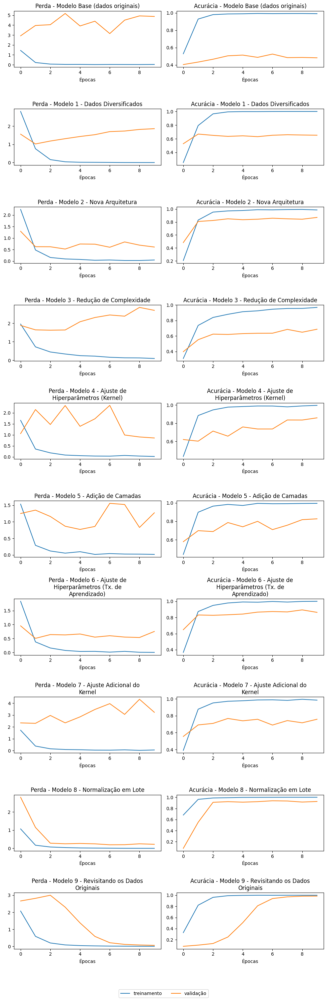

In [73]:
plot_all_loss_curves(histories, titles)

# Realizando Predições

In [75]:
# O script abaixo carrega, prepara e executa predição de classe de uma imagem em determinado modelo

from tensorflow.keras.models import Model

def load_and_preprocess_image(image_path, target_size):
    image = Image.open(image_path)
    image = image.resize(target_size)
    image_array = np.array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

def plot_image(image_array):
    if image_array.ndim == 4:
        image_array = np.squeeze(image_array, axis=0)
    plt.imshow(image_array)
    plt.axis('off')
    plt.show()

def predict_image_class(model: Model, image_path: str, target_size: tuple, class_names: list):
    image_array = load_and_preprocess_image(image_path, target_size)
    plot_image(image_array)
    
    predictions = model.predict(image_array)
    probabilities = predictions[0] * 100
    probability_df = pd.DataFrame({"Classe": class_names, "Probabilidade (%)": probabilities})
    
    styled_df = probability_df.style.set_table_styles([
        {"selector": "th", "props": [("text-align", "center")]},
        {"selector": "td", "props": [("text-align", "center")]}
    ]).format({"Probabilidade (%)": "{:.2f}"})

    print("\nProbabilidade para cada classe:")
    display(styled_df)
    
    print(f"\nA classe predita é: {class_names[predictions[0].argmax()]}")

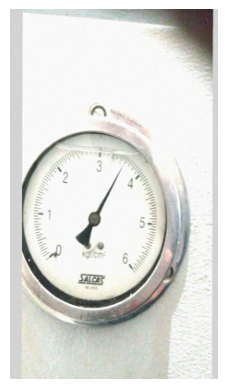

1/1 [==============================] - 0s 122ms/step

Probabilidade para cada classe:


,Classe,Probabilidade (%)
0,0,0.00
1,0_5,0.00
2,1,0.00
3,1_5,0.00
4,2,0.00
5,2_5,0.00
6,3,0.00
7,3_5,99.94
8,4,0.06
9,4_5,0.00



A classe predita é: 3_5


In [76]:
# Caminho e tamanho da imagem para predição 
image_path = "Test_Classes/3_5/3_5_6.jpeg"
target_size = (225, 400)

# Chamada da função utilizando o modelo 8
predict_image_class(model_8, image_path, target_size, class_names)
